### Testing notebook

This interactive notebook is included for you to use for exploratory data analysis and for prototyping map applets

In [1]:
import os
os.chdir("..")
os.getcwd()

'c:\\Users\\kempsj1\\asap-coding-challenge'

### Exploring feature data (median annual pay by local authority)

In [2]:
# Explore local authority data
from mapping.prep_data import *

lad_df = get_df_from_db()

lad_df

,year,lad,median_ann_pay
0,2002,Hartlepool,<NA>
1,2003,Hartlepool,<NA>
2,2004,Hartlepool,<NA>
3,2005,Hartlepool,<NA>
4,2006,Hartlepool,<NA>
...,...,...,...
8068,2020,Column Total,<NA>
8069,2021,Column Total,<NA>
8070,2022,Column Total,<NA>
8071,2023,Column Total,<NA>


Filter data

In [3]:
# Use 2024 data only
lad_df_2024 = lad_df[lad_df["year"]==2024]

# Remove NAs
lad_df_2024 = lad_df_2024.dropna()

lad_df_2024

,year,lad,median_ann_pay
22,2024,Hartlepool,27504
45,2024,Middlesbrough,27406
68,2024,Redcar and Cleveland,26572
91,2024,Stockton-on-Tees,28454
114,2024,Darlington,27559
...,...,...,...
7957,2024,East Dunbartonshire,38589
7980,2024,Fife,30808
8003,2024,Perth and Kinross,31382
8026,2024,Glasgow City,30690


In [4]:
lad_df_2024.dtypes

year               int64
lad               object
median_ann_pay     Int32
dtype: object

In [5]:
# Cast type - Folium map functions don't play nice with Int32
lad_df_2024["median_ann_pay"] = lad_df_2024["median_ann_pay"].astype("int64")

### Exploring spatial data (local authority boundaries)

In [6]:
# Explore geojson data
import geopandas

geo_data = geopandas.read_file("data/local_authority_district_boundaries.geojson")

geo_data.head()

,FID,LAD24CD,LAD24NM,LAD24NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319..."
1,2,E06000002,Middlesbrough,,451141,516887,-1.21100,54.54468,b897a799-65cd-413a-a79c-521fd2986aa5,"POLYGON ((-1.19861 54.58287, -1.16664 54.55423..."
2,3,E06000003,Redcar and Cleveland,,464330,519596,-1.00657,54.56752,05c2cef1-c39b-4250-acc8-a2eab00a5f0f,"POLYGON ((-0.7918 54.55831, -0.80042 54.55101,..."
3,4,E06000004,Stockton-on-Tees,,444940,518179,-1.30665,54.55688,ee992892-bd1a-4478-aa48-8774a14f0e61,"POLYGON ((-1.19228 54.62947, -1.20065 54.62294..."
4,5,E06000005,Darlington,,428029,515648,-1.56836,54.53534,e023797a-6a3f-4819-93e2-cff964746280,"POLYGON ((-1.43836 54.59508, -1.42333 54.60313..."


### Join feature data on spatial data

In [7]:
geo_data = geo_data.merge(
    lad_df_2024,
    how="left",
    left_on="LAD24NM",
    right_on="lad"
)

geo_data.head()

,FID,LAD24CD,LAD24NM,LAD24NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,year,lad,median_ann_pay
0,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2024.0,Hartlepool,27504.0
1,2,E06000002,Middlesbrough,,451141,516887,-1.21100,54.54468,b897a799-65cd-413a-a79c-521fd2986aa5,"POLYGON ((-1.19861 54.58287, -1.16664 54.55423...",2024.0,Middlesbrough,27406.0
2,3,E06000003,Redcar and Cleveland,,464330,519596,-1.00657,54.56752,05c2cef1-c39b-4250-acc8-a2eab00a5f0f,"POLYGON ((-0.7918 54.55831, -0.80042 54.55101,...",2024.0,Redcar and Cleveland,26572.0
3,4,E06000004,Stockton-on-Tees,,444940,518179,-1.30665,54.55688,ee992892-bd1a-4478-aa48-8774a14f0e61,"POLYGON ((-1.19228 54.62947, -1.20065 54.62294...",2024.0,Stockton-on-Tees,28454.0
4,5,E06000005,Darlington,,428029,515648,-1.56836,54.53534,e023797a-6a3f-4819-93e2-cff964746280,"POLYGON ((-1.43836 54.59508, -1.42333 54.60313...",2024.0,Darlington,27559.0


### Folium map prototyping

In [8]:
import folium

m = folium.Map(
    location=[51.58,  -2.99],
    width=500,
    height=720,
    zoom_start=6,
    max_zoom=6,
    tiles=None
)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    data=geo_data,
    columns=["lad", "median_ann_pay"],
    key_on="properties.LAD24NM",
    nan_fill_color="purple",
    nan_fill_opacity=0.4,
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Median Gross Annual Pay (£)"
).add_to(m)

popup = folium.GeoJsonPopup(
    fields=["lad", "median_ann_pay"],
    aliases=["Name", "Median Ann. Pay"],
    localize=True
).add_to(choropleth.geojson)


m

In [9]:
# 2014 - 2024
year_list = [i for i in range(2014, 2025)]

lad_df_range = lad_df[lad_df["year"].isin(year_list)]

# Remove NAs
lad_df_range = lad_df_range.fillna(0)

lad_df_range

,year,lad,median_ann_pay
12,2014,Hartlepool,20925
13,2015,Hartlepool,21855
14,2016,Hartlepool,22160
15,2017,Hartlepool,22971
16,2018,Hartlepool,22322
...,...,...,...
8068,2020,Column Total,0
8069,2021,Column Total,0
8070,2022,Column Total,0
8071,2023,Column Total,0


In [10]:
# Cast type - Folium map functions don't play nice with Int32
lad_df_range["median_ann_pay"] = lad_df_range["median_ann_pay"].astype("int64")

In [11]:
range_geo_data = geopandas.read_file("data/local_authority_district_boundaries.geojson")

range_geo_data.head()

,FID,LAD24CD,LAD24NM,LAD24NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319..."
1,2,E06000002,Middlesbrough,,451141,516887,-1.21100,54.54468,b897a799-65cd-413a-a79c-521fd2986aa5,"POLYGON ((-1.19861 54.58287, -1.16664 54.55423..."
2,3,E06000003,Redcar and Cleveland,,464330,519596,-1.00657,54.56752,05c2cef1-c39b-4250-acc8-a2eab00a5f0f,"POLYGON ((-0.7918 54.55831, -0.80042 54.55101,..."
3,4,E06000004,Stockton-on-Tees,,444940,518179,-1.30665,54.55688,ee992892-bd1a-4478-aa48-8774a14f0e61,"POLYGON ((-1.19228 54.62947, -1.20065 54.62294..."
4,5,E06000005,Darlington,,428029,515648,-1.56836,54.53534,e023797a-6a3f-4819-93e2-cff964746280,"POLYGON ((-1.43836 54.59508, -1.42333 54.60313..."


In [12]:
range_geo_data = range_geo_data.merge(
    lad_df_range,
    how="left",
    left_on="LAD24NM",
    right_on="lad"
)

range_geo_data.head()

,FID,LAD24CD,LAD24NM,LAD24NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,year,lad,median_ann_pay
0,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2014.0,Hartlepool,20925.0
1,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2015.0,Hartlepool,21855.0
2,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2016.0,Hartlepool,22160.0
3,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2017.0,Hartlepool,22971.0
4,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2018.0,Hartlepool,22322.0


In [13]:

year_df = pd.DataFrame(year_list, columns=['year'])

year_df['Years'] = pd.to_datetime(year_df['year'], format='%Y')

year_df['epoch'] = year_df['Years'].astype('int64') // 10**9

year_df['year_index'] = year_df['epoch'].astype('U10')

year_df[['year', 'year_index']]

,year,year_index
0,2014,1388534400
1,2015,1420070400
2,2016,1451606400
3,2017,1483228800
4,2018,1514764800
5,2019,1546300800
6,2020,1577836800
7,2021,1609459200
8,2022,1640995200
9,2023,1672531200


In [14]:
lad_df_range.head()


,year,lad,median_ann_pay
12,2014,Hartlepool,20925
13,2015,Hartlepool,21855
14,2016,Hartlepool,22160
15,2017,Hartlepool,22971
16,2018,Hartlepool,22322


In [15]:
import numpy as np

df_lad_epoch = pd.merge(lad_df_range, year_df[['year', 'year_index']], on='year')

df_map_above_zero = df_lad_epoch[df_lad_epoch.median_ann_pay > 0].copy()

df_map_below_zero = df_lad_epoch[df_lad_epoch.median_ann_pay == 0].copy()

df_map_above_zero.head()

YlGn = ['#ffffcc', '#d9f0a3', '#addd8e', '#78c679', '#41ab5d', '#238443', '#005a32']
YlGn_opc = 0.7
purple = '#800080'
purple_opc = 0.4

df_map_below_zero['color'] = purple
df_map_below_zero['opacity'] = purple_opc

def norm(x):
    return (x - x.min()) / (x.max() - x.min())

df_map_above_zero['norm_map'] = norm(df_map_above_zero['median_ann_pay'])

num_len = len(YlGn)

colour_range = np.arange(0,1+1/num_len,1/num_len).tolist()

'''
for i in range(len(YlGn)):
    colour_map[YlGn[i]] = (colour_range[i], colour_range[i+1])

def get_colour(x, colour_map=colour_map):
    for key, value in colour_map.items():
        if value[0] <= x <= value[1]:
            return key
'''
condition = [
    df_map_above_zero['norm_map'].between(colour_range[0], colour_range[1]),
    df_map_above_zero['norm_map'].between(colour_range[1], colour_range[2]),
    df_map_above_zero['norm_map'].between(colour_range[2], colour_range[3]),
    df_map_above_zero['norm_map'].between(colour_range[3], colour_range[4]),
    df_map_above_zero['norm_map'].between(colour_range[4], colour_range[5]),
    df_map_above_zero['norm_map'].between(colour_range[5], colour_range[6]),
    df_map_above_zero['norm_map'].between(colour_range[6], colour_range[7])
]

df_map_above_zero['color'] = np.select(condition, YlGn, purple)
df_map_above_zero['opacity'] = YlGn_opc

col_list = ['lad', 'year_index', 'color', 'opacity']
df_colour_map = pd.concat([df_map_above_zero[col_list], df_map_below_zero[col_list]]) #+ df_map_below_zero[col_list]

'''{
    'Hartlepool': {
        '1388534400': {'color': 'd9f0a3', 'opacity': 0.7}
        '1420070400': {'color': 'd9f0a3', 'opacity': 0.7}
        ...
    }
}'''
df_colour_map.set_index('year_index', inplace=True)
df_colour_map


,lad,color,opacity
year_index,,,
1388534400,Hartlepool,#d9f0a3,0.7
1420070400,Hartlepool,#d9f0a3,0.7
1451606400,Hartlepool,#d9f0a3,0.7
1483228800,Hartlepool,#d9f0a3,0.7
1514764800,Hartlepool,#d9f0a3,0.7
...,...,...,...
1577836800,Column Total,#800080,0.4
1609459200,Column Total,#800080,0.4
1640995200,Column Total,#800080,0.4


In [16]:
style_data = {}

for lad in df_colour_map.lad.unique():
    style_data[lad] = df_colour_map[df_colour_map.lad == lad][['color', 'opacity']]
    
style_data

{'Hartlepool':               color  opacity
 year_index                  
 1388534400  #d9f0a3      0.7
 1420070400  #d9f0a3      0.7
 1451606400  #d9f0a3      0.7
 1483228800  #d9f0a3      0.7
 1514764800  #d9f0a3      0.7
 1546300800  #d9f0a3      0.7
 1577836800  #d9f0a3      0.7
 1609459200  #d9f0a3      0.7
 1640995200  #d9f0a3      0.7
 1672531200  #addd8e      0.7
 1704067200  #addd8e      0.7,
 'Middlesbrough':               color  opacity
 year_index                  
 1388534400  #ffffcc      0.7
 1420070400  #ffffcc      0.7
 1451606400  #ffffcc      0.7
 1483228800  #ffffcc      0.7
 1514764800  #ffffcc      0.7
 1546300800  #d9f0a3      0.7
 1577836800  #d9f0a3      0.7
 1609459200  #d9f0a3      0.7
 1672531200  #d9f0a3      0.7
 1704067200  #addd8e      0.7
 1640995200  #800080      0.4,
 'Redcar and Cleveland':               color  opacity
 year_index                  
 1388534400  #ffffcc      0.7
 1420070400  #ffffcc      0.7
 1451606400  #ffffcc      0.7
 1483228800  

In [17]:
style_dict = {
    str(country): data.to_dict(orient="index") for country, data in style_data.items()
}
style_dict

{'Hartlepool': {'1388534400': {'color': '#d9f0a3', 'opacity': 0.7},
  '1420070400': {'color': '#d9f0a3', 'opacity': 0.7},
  '1451606400': {'color': '#d9f0a3', 'opacity': 0.7},
  '1483228800': {'color': '#d9f0a3', 'opacity': 0.7},
  '1514764800': {'color': '#d9f0a3', 'opacity': 0.7},
  '1546300800': {'color': '#d9f0a3', 'opacity': 0.7},
  '1577836800': {'color': '#d9f0a3', 'opacity': 0.7},
  '1609459200': {'color': '#d9f0a3', 'opacity': 0.7},
  '1640995200': {'color': '#d9f0a3', 'opacity': 0.7},
  '1672531200': {'color': '#addd8e', 'opacity': 0.7},
  '1704067200': {'color': '#addd8e', 'opacity': 0.7}},
 'Middlesbrough': {'1388534400': {'color': '#ffffcc', 'opacity': 0.7},
  '1420070400': {'color': '#ffffcc', 'opacity': 0.7},
  '1451606400': {'color': '#ffffcc', 'opacity': 0.7},
  '1483228800': {'color': '#ffffcc', 'opacity': 0.7},
  '1514764800': {'color': '#ffffcc', 'opacity': 0.7},
  '1546300800': {'color': '#d9f0a3', 'opacity': 0.7},
  '1577836800': {'color': '#d9f0a3', 'opacity': 0.

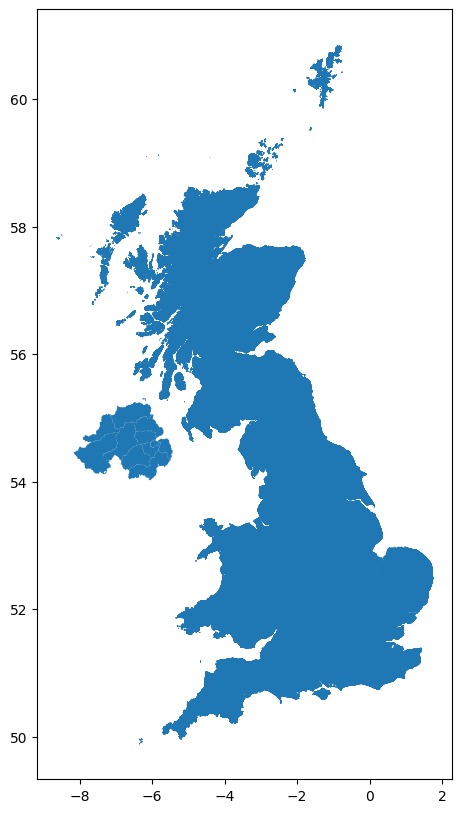

In [18]:
%matplotlib inline

ax = range_geo_data.plot(figsize=(10,10))

In [19]:
range_geo_data

,FID,LAD24CD,LAD24NM,LAD24NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,year,lad,median_ann_pay
0,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2014.0,Hartlepool,20925.0
1,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2015.0,Hartlepool,21855.0
2,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2016.0,Hartlepool,22160.0
3,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2017.0,Hartlepool,22971.0
4,1,E06000001,Hartlepool,,447161,531473,-1.27017,54.67613,c28e4b7c-841f-4db2-91d8-2ab1cef4bd23,"POLYGON ((-1.24133 54.72344, -1.24099 54.72319...",2018.0,Hartlepool,22322.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3846,361,W06000024,Merthyr Tydfil,Merthyr Tudful,305916,206404,-3.36425,51.74841,d9d48ff2-8405-4041-9223-11506b115ac8,"POLYGON ((-3.33447 51.7904, -3.32905 51.75865,...",2020.0,Merthyr Tydfil,23410.0
3847,361,W06000024,Merthyr Tydfil,Merthyr Tudful,305916,206404,-3.36425,51.74841,d9d48ff2-8405-4041-9223-11506b115ac8,"POLYGON ((-3.33447 51.7904, -3.32905 51.75865,...",2021.0,Merthyr Tydfil,24645.0
3848,361,W06000024,Merthyr Tydfil,Merthyr Tudful,305916,206404,-3.36425,51.74841,d9d48ff2-8405-4041-9223-11506b115ac8,"POLYGON ((-3.33447 51.7904, -3.32905 51.75865,...",2022.0,Merthyr Tydfil,25010.0
3849,361,W06000024,Merthyr Tydfil,Merthyr Tudful,305916,206404,-3.36425,51.74841,d9d48ff2-8405-4041-9223-11506b115ac8,"POLYGON ((-3.33447 51.7904, -3.32905 51.75865,...",2023.0,Merthyr Tydfil,26594.0


In [20]:
from folium.plugins import TimeSliderChoropleth

m = folium.Map(
    location=[51.58, -2.99],
    width=500,
    height=720,
    zoom_start=6,
    max_zoom=6,
    tiles=None
)

time_slider = TimeSliderChoropleth(
    data=range_geo_data.to_json(),
    styledict=style_dict,
    date_options='YYYY'
).add_to(m)


m

In [21]:
from folium.plugins import TagFilterButton

m = folium.Map(
    location=[51.58,  -2.99],
    width=500,
    height=720,
    zoom_start=6,
    max_zoom=6,
    tiles=None
)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    data=geo_data,
    columns=["lad", "median_ann_pay"],
    key_on="properties.LAD24NM",
    nan_fill_color="purple",
    nan_fill_opacity=0.4,
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Median Gross Annual Pay (£)"
).add_to(m)

TagFilterButton(year_list).add_to(m)

popup = folium.GeoJsonPopup(
    fields=["lad", "median_ann_pay"],
    aliases=["Name", "MAP"],
    localize=True,
    labels=True
).add_to(choropleth.geojson)


m